In [84]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
import datetime
df = pd.read_csv('https://opendata.ecdc.europa.eu/covid19/casedistribution/csv')
# excludes = ["World", "Africa", "North America", "South America", "Asia", "Europe", 
#             "European Union", "High income", "Low income", "Lower middle income", 
#             "Oceania", "Upper middle income", "World excl. China", 
#             "World excl. China and South Korea", "International",
#             "World excl. China, South Korea, Japan and Singapore","Asia excl. China"]

# df=df[~df['Entity'].isin(excludes)]
# df.columns = ['Country','Code','Date','Confirmed','Days since confirmed']
# df['Date']= pd.to_datetime(df['Date']).dt.strftime('%Y-%m-%d')
# df_all=df[(df['Date']>'2020-03-01') & (df['Date'] <'2020-06-14')]

In [85]:
df.head(10)
df=df.rename(columns={"dateRep":"Date","cases":"Confirmed","countriesAndTerritories":"Country","countryterritoryCode":"Code"})
# df.columns=["Date","Confirmed","Country","Code"]
# print(df["Date"][0][0:2])
# print(df["Date"][0][4:5])
# print(df["Date"][0][6:])
for i in range(len(df.index)):
  # print(df["Date"][i])
  df["Date"][i]=df["Date"][i][6:]+"-"+df["Date"][i][4:5]+"-"+df["Date"][i][0:2]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



2020-6-19
Index(['Date', 'day', 'month', 'year', 'Confirmed', 'deaths', 'Country',
       'geoId', 'Code', 'popData2019', 'continentExp'],
      dtype='object')


<BarContainer object of 10 artists>

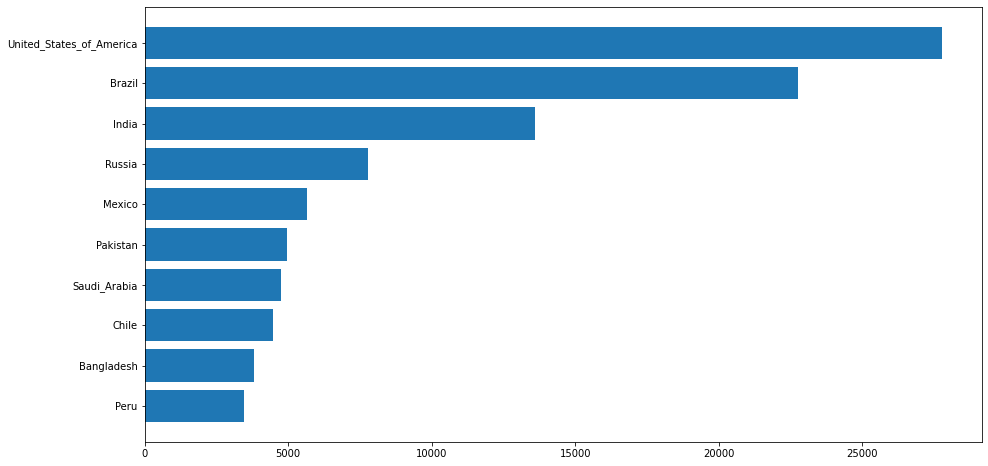

In [86]:
print(df["Date"].max())
print(df.columns)
# df.sort_values(by="Date",ascending=False).head(10)
dff=(df[df['Date'].eq(df["Date"].max())].sort_values(by="Confirmed",ascending=False).head(10))
dff=dff.reindex(index=dff.index[::-1])
fig,ax=plt.subplots(figsize=(15,8))
ax.barh(dff['Country'],dff['Confirmed'])

In [87]:
list1=df["Code"].unique().tolist()
print(len(list1))

colour_blind=['#cd98a2', '#7aa1ff', '#ffddd3', '#33ff66', '#8f8c8b', '#796a71', '#6600cc', '#847064', '#663399', '#a7875c', '#00cc66', '#003399', '#cfcbcb', '#b87178', '#cc3300', '#ffc857', '#aaa5a0', '#009099', '#686666', '#615b68', '#ffcd78', '#ffe75c', '#326ed5', '#666699', '#005e9a', '#0079f2', '#666633', '#719cff', '#ff9900', '#82becd', '#90eeff', '#ecd435', '#356fd5', '#645b2f', '#99ff99', '#d3c4d3', '#86a9b6', '#006f74', '#a27e3d', '#ff66cc', '#005ebf', '#fa4042', '#767591', '#c99b32', '#99ffcc', '#5e98f1', '#82a0f6', '#ecd30f', '#669999', '#57d1e1', '#cc6666', '#a59b7c', '#ede1bd', '#a98200', '#336600', '#ff3332', '#c8b65e', '#cccc99', '#330000', '#838fc0', '#7e8791', '#a6efff', '#b76a71', '#cc00ff', '#ffdecc', '#cccccc', '#3333ff', '#ad841c', '#ffff99', '#74909a', '#76efff', '#b19992', '#ff666c', '#bfa9b6', '#8093cd', '#ff3366', '#009933', '#ffffcc', '#8c8a90', '#a5bbff', '#cc0099', '#ffea86', '#ff00cc', '#91d1e1', '#b9b7bf', '#cab500', '#99cc99', '#33cc99', '#669933', '#0066cc', '#373133', '#59699c', '#856726', '#fc9faa', '#563f44', '#ffbeca', '#9d5f66', '#005d96', '#c4ceff', '#ccff99', '#dec6cd', '#008de8', '#6f6300', '#0070e1', '#bb955e', '#0066ff', '#1e1b08', '#aebbf2', '#55514a', '#666666', '#4a420b', '#ff6699', '#00cc99', '#635800', '#8f6d00', '#660033', '#003f67', '#6666cc', '#996666', '#330099', '#8a92c1', '#d7c1cf', '#3366ff', '#00ffcc', '#9d8b8f', '#e0ac2e', '#674f00', '#0074ea', '#993366', '#00595e', '#c4c1c6', '#fee65e', '#fccd99', '#8befff', '#42545b', '#005995', '#cc0033', '#99ccff', '#856f5f', '#a8801a', '#586a98', '#9a656c', '#33ffff', '#993300', '#660099', '#705600', '#918f93', '#f7e9c1', '#ccffff', '#baa198', '#963d40', '#ff3300', '#ff949d', '#ffd080', '#cccc33', '#ffff33', '#47c4d3', '#7e6a5e', '#bdbbc1', '#b9c4ff', '#cc66cc', '#0090ee', '#9a8b23', '#d2b29f', '#66cc66', '#7f8ec3', '#b4eeff', '#cc00cc', '#cf5f65', '#00d0df', '#9d826b', '#74efff', '#663336', '#b1b8e0', '#999900', '#c5b000', '#004347', '#ccff66', '#363033', '#6666ff', '#66cc00', '#19376a', '#339966', '#83a4ff', '#ffca6f', '#385b90', '#ccff33', '#cc33ff', '#cc3399', '#cecad9', '#46433a', '#8cabff', '#54c1cf', '#73eeff', '#c49d65', '#663366', '#cc9999', '#0059b4', '#415f66', '#fbe790', '#1f97a3', '#78746d', '#9b8b2f', '#6c552d', '#a3c4d3', '#bbb3d1', '#a4876a', '#ff0066', '#cc3366']

206


In [88]:
colors=dict(zip(list1,colour_blind))
group_lk=df.set_index('Country')['Code'].to_dict()

Text(1, 0.4, '2020-6-19')

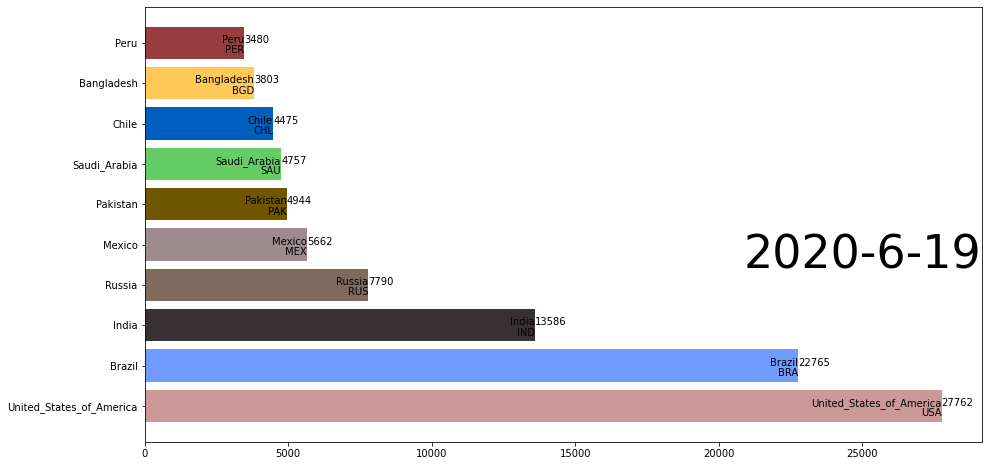

In [89]:
fig,ax=plt.subplots(figsize=(15,8))
dff=dff[::-1] #flip values from to bottom
#pass colors values to color=
ax.barh(dff['Country'],dff['Confirmed'],color=[colors[group_lk[x]] for x in dff['Country']])
for i,(value,name) in enumerate(zip(dff['Confirmed'],dff['Country'])):
  ax.text(value,i,name,ha='right') #tokyo: name
  ax.text(value,i-.25,group_lk[name],ha='right') #asia : group name
  ax.text(value,i,value,ha='left') #28194.2
  #Add year right middle portion of canvas
ax.text(1,0.4,df["Date"].max(),transform=ax.transAxes,size=46,ha='right')

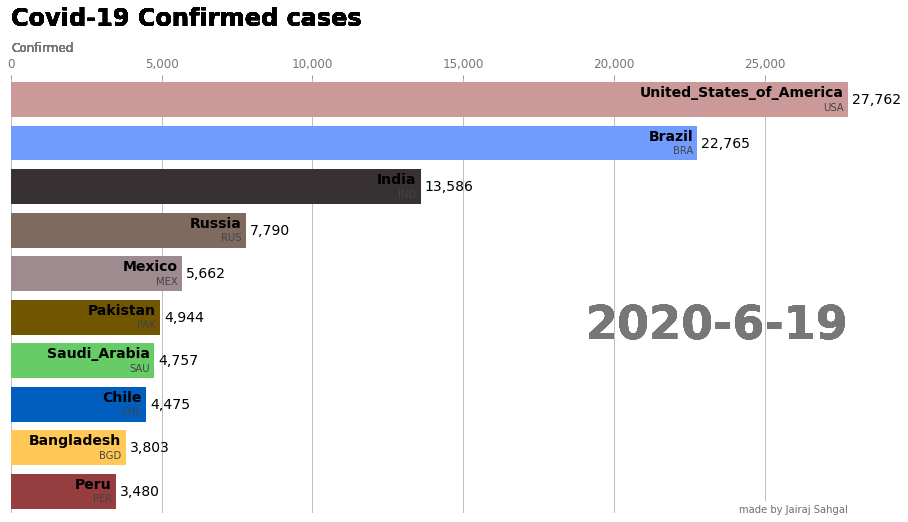

In [90]:
fig,ax=plt.subplots(figsize=(15,8))
def draw_barchart(year):
  dff=df[df['Date'].eq(year)].sort_values(by='Confirmed',ascending=True).tail(10)
  ax.clear()
  ax.barh(dff['Country'],dff['Confirmed'],color=[colors[group_lk[x]] for x in dff['Country']])
  dx=dff['Confirmed'].max()/200
  for i,(value,name) in enumerate(zip(dff['Confirmed'],dff['Country'])):
    ax.text(value-dx,i,name,size=14,weight=600,ha='right',va='bottom')
    ax.text(value-dx,i-.25,group_lk[name],size=10,color='#444444',ha='right',va='baseline')
    ax.text(value+dx,i,f'{value:,.0f}',size=14,ha='left',va='center')
    #...polished styles
    ax.text(1,0.4,year,transform=ax.transAxes,color='#777777',size=46,ha='right',weight=800)
    ax.text(0,1.06,'Confirmed',transform=ax.transAxes,size=12,color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x',colors='#777777',labelsize=12)
    ax.set_yticks([])
    ax.margins(0,0.01)
    ax.grid(which='major',axis='x',linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0,1.12,'Covid-19 Confirmed cases',transform=ax.transAxes,size=24,weight=600,ha='left')
    ax.text(1,0,'made by Jairaj Sahgal',transform=ax.transAxes,ha='right',color='#777777',bbox=dict(facecolor='white',alpha=0.8,edgecolor='white'))
    plt.box(False)
draw_barchart(df["Date"].max())

In [91]:
# print(min(df["Date"]))
# print(max(df["Date"]))
# print(df["Date"].sort_values())

np.sort(df["Date"].unique())

array(['2019-2-31', '2020-1-01', '2020-1-02', '2020-1-03', '2020-1-04',
       '2020-1-05', '2020-1-06', '2020-1-07', '2020-1-08', '2020-1-09',
       '2020-1-10', '2020-1-11', '2020-1-12', '2020-1-13', '2020-1-14',
       '2020-1-15', '2020-1-16', '2020-1-17', '2020-1-18', '2020-1-19',
       '2020-1-20', '2020-1-21', '2020-1-22', '2020-1-23', '2020-1-24',
       '2020-1-25', '2020-1-26', '2020-1-27', '2020-1-28', '2020-1-29',
       '2020-1-30', '2020-1-31', '2020-2-01', '2020-2-02', '2020-2-03',
       '2020-2-04', '2020-2-05', '2020-2-06', '2020-2-07', '2020-2-08',
       '2020-2-09', '2020-2-10', '2020-2-11', '2020-2-12', '2020-2-13',
       '2020-2-14', '2020-2-15', '2020-2-16', '2020-2-17', '2020-2-18',
       '2020-2-19', '2020-2-20', '2020-2-21', '2020-2-22', '2020-2-23',
       '2020-2-24', '2020-2-25', '2020-2-26', '2020-2-27', '2020-2-28',
       '2020-2-29', '2020-3-01', '2020-3-02', '2020-3-03', '2020-3-04',
       '2020-3-05', '2020-3-06', '2020-3-07', '2020-3-08', '2020

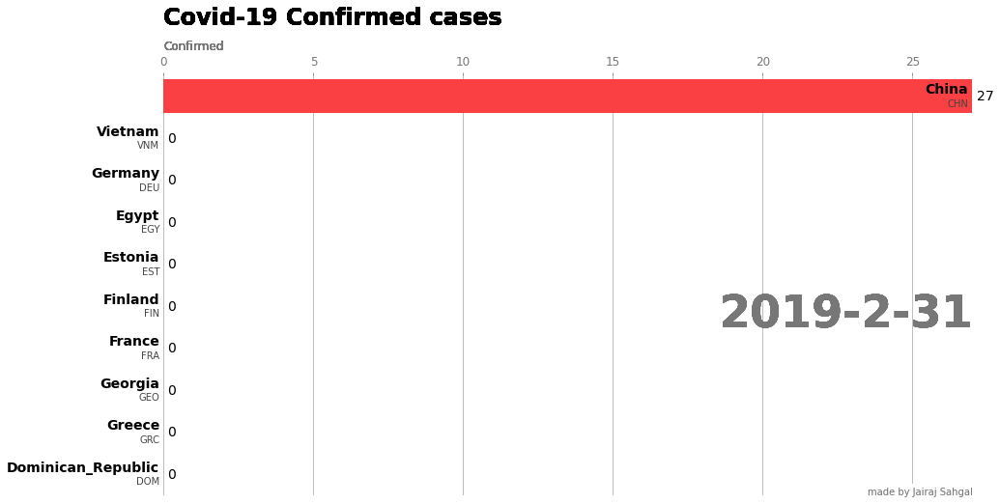

In [93]:

fig, ax=plt.subplots(figsize=(15,8))
animator=animation.FuncAnimation(fig,draw_barchart,frames=np.sort(df["Date"].unique()))
HTML(animator.to_jshtml())